**The RetinaFace deep learning framework was used to detect faces resized to 100 x 100 spatial resoution. Here, the extracted faces are loaded from its saved location.**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from PIL import Image
import os
import cv2

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
folder_path = "/content/drive/My Drive/UTKFace_retina_cropped_100x100/"

cnt = 0
with open('Retina100_input_image_paths.txt', 'a') as f:    # 'a' : append
  for file in sorted(os.listdir(folder_path)):  # Sort file list
    file_path = os.path.join(folder_path,file)
    cnt = cnt + 1
    f.write(file_path)

print(f"Number of faces: {cnt}")

Number of faces: 23565


In [ ]:
folder_path = "/content/drive/My Drive/UTKFace_retina_cropped_100x100/"

# age: is an integer from 0 to 116, indicating the age
# gender: is either 0 (male) or 1 (female)
# race: is an integer from 0 to 4, denoting White, Black, Asian, Indian, and Others (like Hispanic, Latino, Middle Eastern).

column_names = ['Age', 'Gender', 'Race']
records = []
path_list = []

for file in os.listdir(folder_path):
  file_path = os.path.join(folder_path,file)
  records.append(file.split('_')[:-1])
  path_list.append(file_path)

DF=pd.DataFrame(records, columns=column_names)
DF['Path'] = path_list
DF.head()

,Age,Gender,Race,Path
0,48,0,3,/content/drive/My Drive/UTKFace_retina_cropped...
1,48,0,3,/content/drive/My Drive/UTKFace_retina_cropped...
2,48,1,0,/content/drive/My Drive/UTKFace_retina_cropped...
3,48,1,0,/content/drive/My Drive/UTKFace_retina_cropped...
4,48,1,0,/content/drive/My Drive/UTKFace_retina_cropped...


In [ ]:
DF['Age'].describe()

,Age
count,23565
unique,104
top,26
freq,2178


In [ ]:
DF.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23565 entries, 0 to 23564
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Age     23565 non-null  object
 1   Gender  23565 non-null  object
 2   Race    23562 non-null  object
 3   Path    23565 non-null  object
dtypes: object(4)
memory usage: 736.5+ KB


In [ ]:
# Replace empty strings with NaN
DF.replace('', np.nan, inplace=True)

# Drop rows with NaN values
DF.dropna(inplace=True)

# Convert to integer type
DF['Age'] = DF['Age'].astype(int)
DF['Gender'] = DF['Gender'].astype(int)
DF['Race'] = DF['Race'].astype(int)

DF.head()

,Age,Gender,Race,Path
0,48,0,3,/content/drive/My Drive/UTKFace_retina_cropped...
1,48,0,3,/content/drive/My Drive/UTKFace_retina_cropped...
2,48,1,0,/content/drive/My Drive/UTKFace_retina_cropped...
3,48,1,0,/content/drive/My Drive/UTKFace_retina_cropped...
4,48,1,0,/content/drive/My Drive/UTKFace_retina_cropped...


In [ ]:
DF.info()

<class 'pandas.core.frame.DataFrame'>
Index: 23561 entries, 0 to 23564
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Age     23561 non-null  int64 
 1   Gender  23561 non-null  int64 
 2   Race    23561 non-null  int64 
 3   Path    23561 non-null  object
dtypes: int64(3), object(1)
memory usage: 920.4+ KB


## Distribution of gender

Text(0.5, 1.0, 'Distribution of gender in the UTKFace dataset')

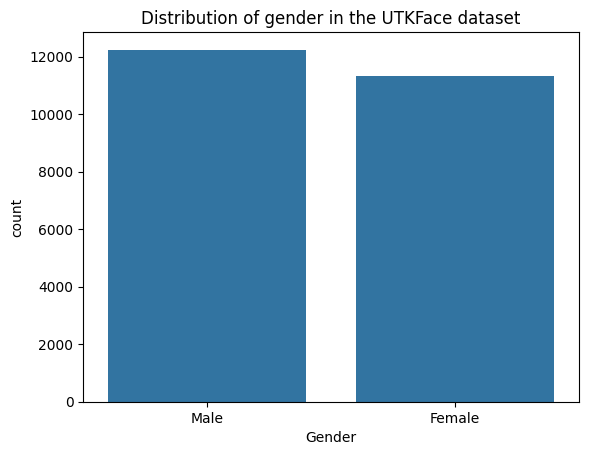

In [ ]:
gender_mapping = {
    0: 'Male',
    1: 'Female'
}

DFrame = DF.copy()

# Replace the integers with correct gender
DFrame['Gender'] = DF['Gender'].replace(gender_mapping)

# Count plot
plt.figure()
sns.countplot(x='Gender', data=DFrame)
plt.title('Distribution of gender in the UTKFace dataset')

## Distribution of race

Text(0.5, 1.0, 'Distribution of race in the UTKFace dataset')

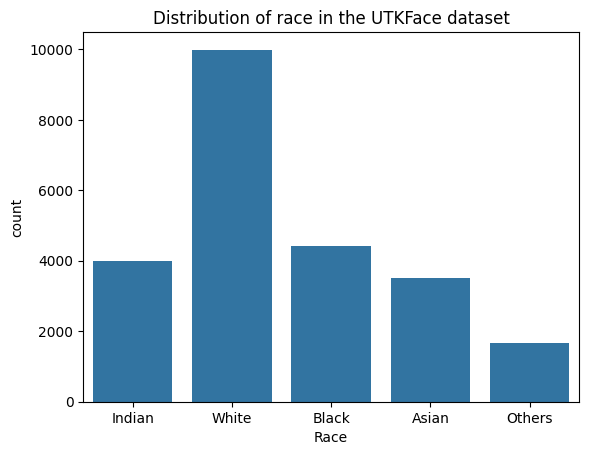

In [ ]:
# Race Mapping
race_mapping = {
    0 : 'White',
    1 : 'Black',
    2 : 'Asian',
    3 : 'Indian',
    4 : 'Others'
}

# Replace the integers with correct race
DFrame['Race'] = DFrame['Race'].replace(race_mapping)

# Count plot
plt.figure()
sns.countplot(x='Race', data=DFrame)
plt.title('Distribution of race in the UTKFace dataset')

### Race count by gender

Text(0.5, 1.0, 'Race count by gender')

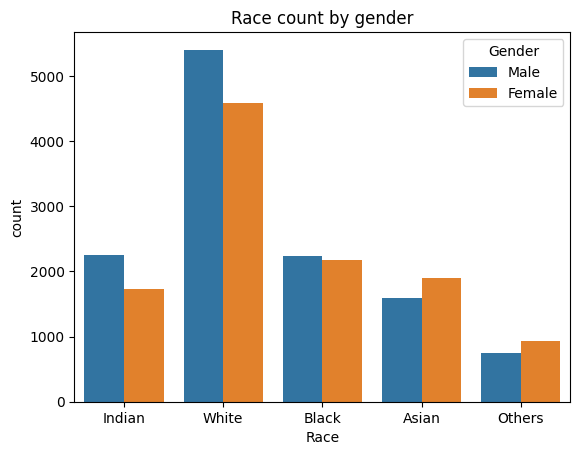

In [ ]:
# Count plot
plt.figure()
sns.countplot(x='Race', hue='Gender', data=DFrame)
plt.title('Race count by gender')

## Distribution of age groups

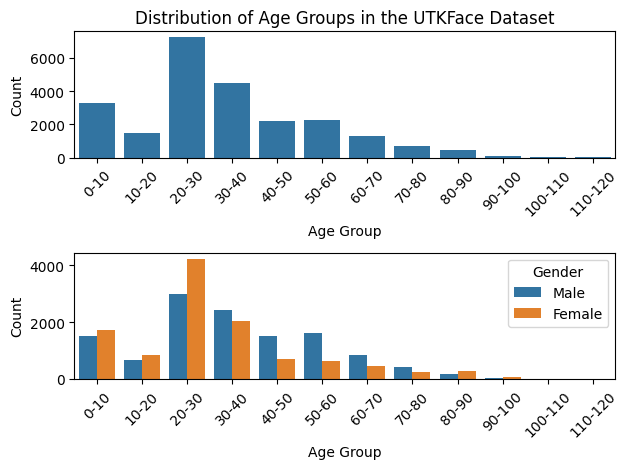

In [ ]:
# Create age bins and group labels
bins = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120]  # Define age groups
labels = ['0-10', '10-20', '20-30', '30-40', '40-50', '50-60', '60-70', '70-80',
          '80-90', '90-100','100-110', '110-120']

# Add a new column 'AgeGroup' with the categorized age ranges
DFrame['AgeGroup'] = pd.cut(DFrame['Age'], bins=bins, labels=labels, right=False)

# Plot the distribution of age groups
fig, ax = plt.subplots(2, 1)
sns.countplot(x='AgeGroup', data=DFrame, ax=ax[0])
sns.countplot(x='AgeGroup', hue='Gender', data=DFrame, ax=ax[1])

# Customize plot
ax[0].set_title('Distribution of Age Groups in the UTKFace Dataset')
ax[0].set_xlabel('Age Group')
ax[0].set_ylabel('Count')
ax[1].set_xlabel('Age Group')
ax[1].set_ylabel('Count')

# Rotate x-tick labels for both axes
for a in ax:
    for label in a.get_xticklabels():
        label.set_rotation(45)  # Rotate x-tick labels by 45 degrees

plt.tight_layout()
plt.show()

## Meaningful age groups for age estimation

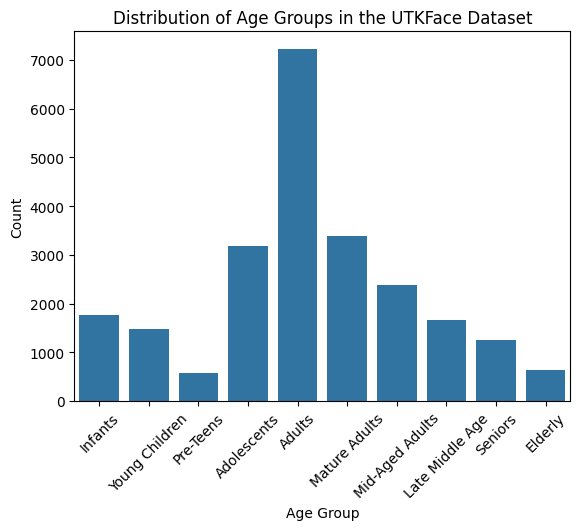

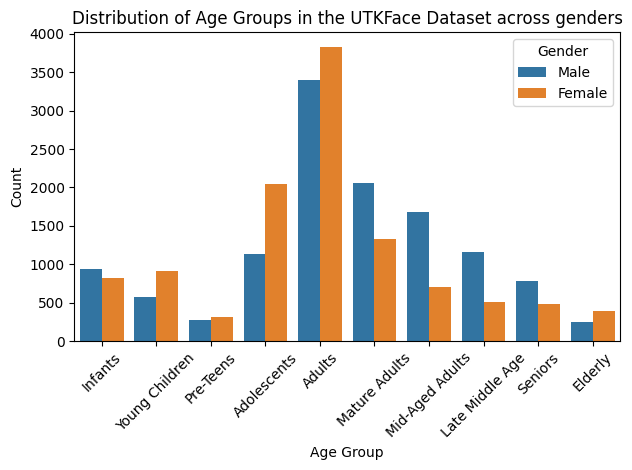

In [ ]:
# Define bins and labels
bins = [0, 2, 9, 14, 24, 34, 44, 54, 64, 79, 116]
labels = ["Infants", "Young Children", "Pre-Teens", "Adolescents",
          "Adults", "Mature Adults", "Mid-Aged Adults", "Late Middle Age", "Seniors", "Elderly"]

# Classify ages into groups
DFrame['AgeGroup_2'] = pd.cut(DFrame['Age'], bins=bins, labels=labels, right=True)  # (0, 2], (3,9], (10, 14],...

# Plot the distribution of age groups
fig1, ax1 = plt.subplots()
sns.countplot(x='AgeGroup_2', data=DFrame, ax=ax1)
ax1.set_title('Distribution of Age Groups in the UTKFace Dataset')
ax1.set_xlabel('Age Group')
ax1.set_ylabel('Count')


# Plot the distribution of age groups with gender
fig1, ax2 = plt.subplots()
sns.countplot(x='AgeGroup_2', hue='Gender', data=DFrame, ax=ax2)
ax2.set_title('Distribution of Age Groups in the UTKFace Dataset across genders')
ax2.set_xlabel('Age Group')
ax2.set_ylabel('Count')

# Rotate x-tick labels for both axes
for label in ax1.get_xticklabels():
  label.set_rotation(45)  # Rotate x-tick labels by 45 degrees

for label in ax2.get_xticklabels():
  label.set_rotation(45)  # Rotate x-tick labels by 45 degrees

plt.tight_layout()
plt.show()

In [ ]:
# Sample 5 entries from each age group
sampled_DFrame = DFrame.groupby('AgeGroup_2').apply(lambda x: x.sample(n=5, random_state=2)).reset_index(drop=True)
sampled_DFrame

<ipython-input-107-d03ee504d163>:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sampled_DFrame = DFrame.groupby('AgeGroup_2').apply(lambda x: x.sample(n=5, random_state=2)).reset_index(drop=True)
<ipython-input-107-d03ee504d163>:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_DFrame = DFrame.groupby('AgeGroup_2').apply(lambda x: x.sample(n=5, random_state=2)).reset_index(drop=True)


,Age,Gender,Race,Path,AgeGroup,AgeGroup_2
0,1,Male,White,/content/drive/My Drive/UTKFace_retina_cropped...,0-10,Infants
1,1,Female,White,/content/drive/My Drive/UTKFace_retina_cropped...,0-10,Infants
2,1,Male,Asian,/content/drive/My Drive/UTKFace_retina_cropped...,0-10,Infants
3,1,Male,Asian,/content/drive/My Drive/UTKFace_retina_cropped...,0-10,Infants
4,1,Male,Asian,/content/drive/My Drive/UTKFace_retina_cropped...,0-10,Infants
5,4,Female,Indian,/content/drive/My Drive/UTKFace_retina_cropped...,0-10,Young Children
6,7,Female,Others,/content/drive/My Drive/UTKFace_retina_cropped...,0-10,Young Children
7,3,Female,Asian,/content/drive/My Drive/UTKFace_retina_cropped...,0-10,Young Children
8,4,Male,White,/content/drive/My Drive/UTKFace_retina_cropped...,0-10,Young Children
9,9,Male,White,/content/drive/My Drive/UTKFace_retina_cropped...,0-10,Young Children


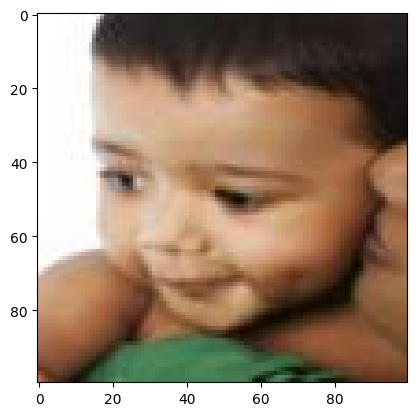

In [ ]:
## Reading an example image
img = cv2.imread(sampled_DFrame['Path'][0], cv2.IMREAD_COLOR)
# Convert default BGR format to RGB to use in Matplotlib
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure()
plt.imshow(img)

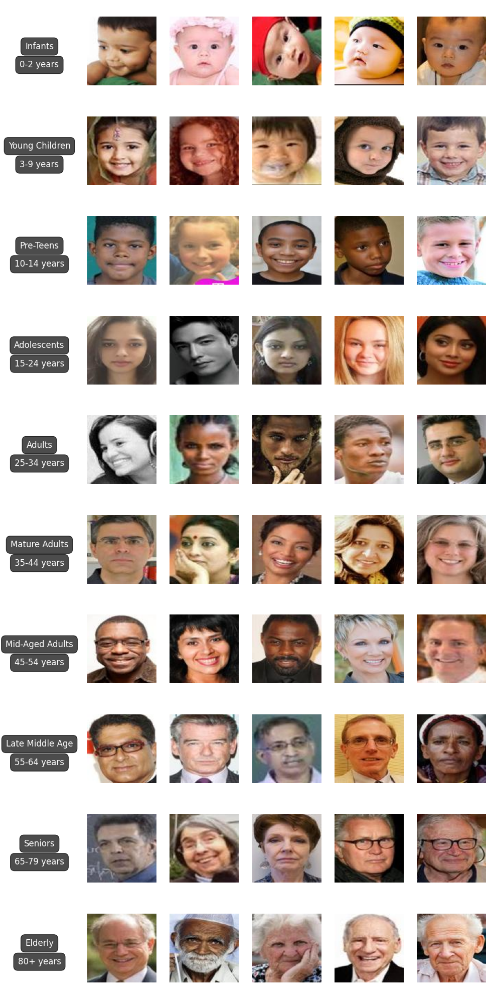

In [ ]:
# labels for each row
labels = ["Infants", "Young Children", "Pre-Teens", "Adolescents",
          "Adults", "Mature Adults", "Mid-Aged Adults", "Late Middle Age",
          "Seniors", "Elderly"]
age_range = ["0-2 years", "3-9 years", "10-14 years", "15-24 years",
             "25-34 years", "35-44 years", "45-54 years", "55-64 years",
             "65-79 years", "80+ years"
             ]

# Set up the plot
fig, ax = plt.subplots(10, 6, figsize=(10, 20))  # Adjusted figsize for small images

# Loop to display the 50 images + 10 labels
image_index = 0
for i in range(60):
    # Determine row and column index
    row, col = divmod(i, 6)

    # Add title for each row only in the first column
    if col == 0:
      ax[row, col].text(0.5, 0.55, labels[row], color="white", fontsize=12,
        ha='center', va='center',transform=ax[row, col].transAxes,
        bbox=dict(facecolor="black", alpha=0.7, boxstyle="round,pad=0.5"))

      ax[row, col].text(0.5, 0.35, age_range[row], color="white", fontsize=12,
        ha='center', va='center',transform=ax[row, col].transAxes,
        bbox=dict(facecolor="black", alpha=0.7, boxstyle="round,pad=0.5"))

      ax[row, col].axis('off')
    else:
      # Load the image from the path
      image_path = sampled_DFrame['Path'].iloc[image_index]
      img = cv2.imread(image_path, cv2.IMREAD_COLOR)
      img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

      # Display the image
      ax[row, col].imshow(img)
      ax[row, col].axis('off')
      image_index = image_index + 1

# Adjust layout to fit all elements
plt.tight_layout()
plt.show()


### Plotting function

In [ ]:
def plotting_images():
  labels = ["Infants", "Young Children", "Pre-Teens", "Adolescents",
            "Adults", "Mature Adults", "Mid-Aged Adults", "Late Middle Age",
            "Seniors", "Elderly"]
  age_range = ["0-2 years", "3-9 years", "10-14 years", "15-24 years",
              "25-34 years", "35-44 years", "45-54 years", "55-64 years",
              "65-79 years", "80+ years"
              ]

  # Set up the plot
  fig, ax = plt.subplots(10, 6, figsize=(10, 20))  # Adjusted figsize for small images

  # Loop to display the 50 images + 10 labels
  image_index = 0
  for i in range(60):
      # Determine row and column index
      row, col = divmod(i, 6)

      # Add title for each row only in the first column
      if col == 0:
        ax[row, col].text(0.5, 0.55, labels[row], color="white", fontsize=12,
          ha='center', va='center',transform=ax[row, col].transAxes,
          bbox=dict(facecolor="black", alpha=0.7, boxstyle="round,pad=0.5"))

        ax[row, col].text(0.5, 0.35, age_range[row], color="white", fontsize=12,
          ha='center', va='center',transform=ax[row, col].transAxes,
          bbox=dict(facecolor="black", alpha=0.7, boxstyle="round,pad=0.5"))

        ax[row, col].axis('off')
      else:
        # Load the image from the path
        image_path = sampled_DFrame['Path'].iloc[image_index]
        img = cv2.imread(image_path, cv2.IMREAD_COLOR)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Display the image
        ax[row, col].imshow(img)
        ax[row, col].axis('off')
        image_index = image_index + 1

  # Adjust layout to fit all elements
  plt.tight_layout()
  plt.show()

### Male Images

<ipython-input-111-9e98a33aac72>:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sampled_DFrame = DFrame[DFrame['Gender']=='Male'].groupby('AgeGroup_2').apply(lambda x: x.sample(n=5, random_state=2)).reset_index(drop=True)
<ipython-input-111-9e98a33aac72>:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_DFrame = DFrame[DFrame['Gender']=='Male'].groupby('AgeGroup_2').apply(lambda x: x.sample(n=5, random_state=2)).reset_index(drop=True)


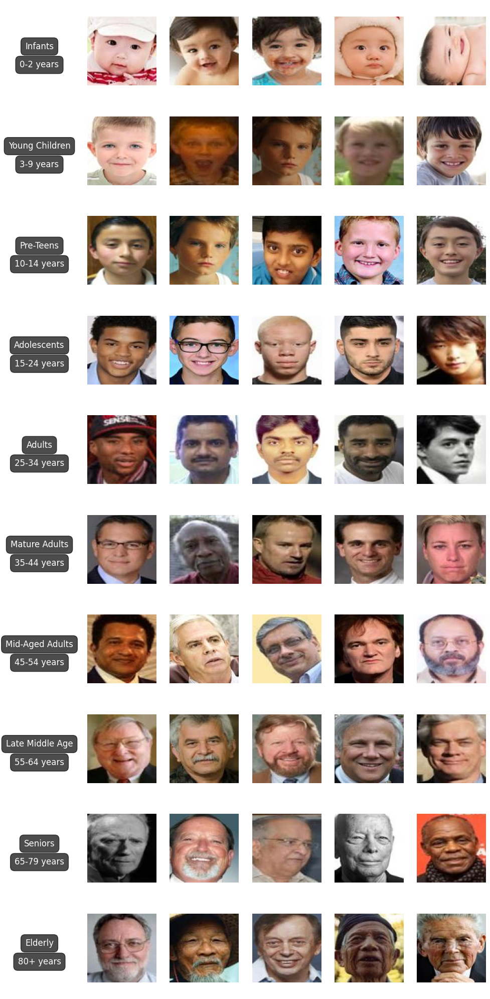

In [ ]:
# Sample 5 entries from each age group in male images
sampled_DFrame = DFrame[DFrame['Gender']=='Male'].groupby('AgeGroup_2').apply(lambda x: x.sample(n=5, random_state=2)).reset_index(drop=True)
plotting_images()

### Female Images

<ipython-input-112-7da96b8ea939>:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sampled_DFrame = DFrame[DFrame['Gender']=='Female'].groupby('AgeGroup_2').apply(lambda x: x.sample(n=5, random_state=2)).reset_index(drop=True)
<ipython-input-112-7da96b8ea939>:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_DFrame = DFrame[DFrame['Gender']=='Female'].groupby('AgeGroup_2').apply(lambda x: x.sample(n=5, random_state=2)).reset_index(drop=True)


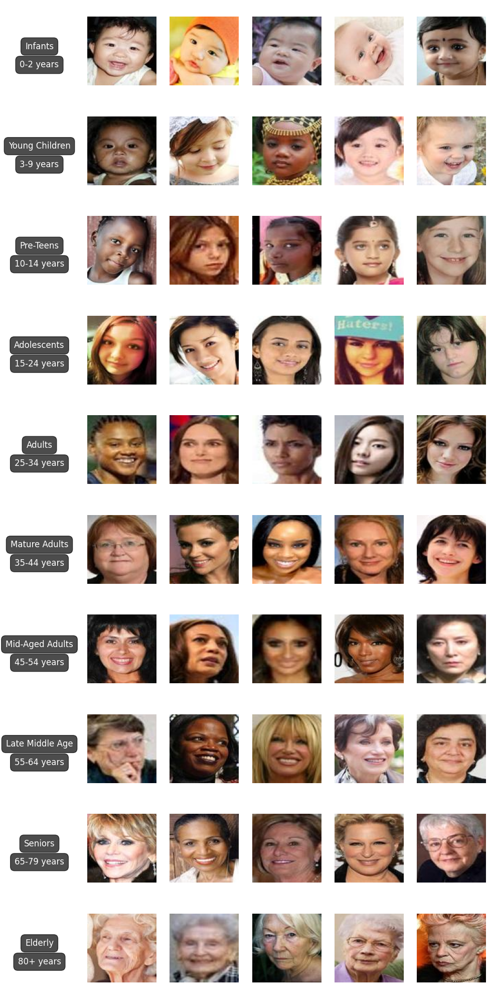

In [ ]:
# Sample 5 entries from each age group in female images
sampled_DFrame = DFrame[DFrame['Gender']=='Female'].groupby('AgeGroup_2').apply(lambda x: x.sample(n=5, random_state=2)).reset_index(drop=True)
plotting_images()

## Nested pie chart: data summary

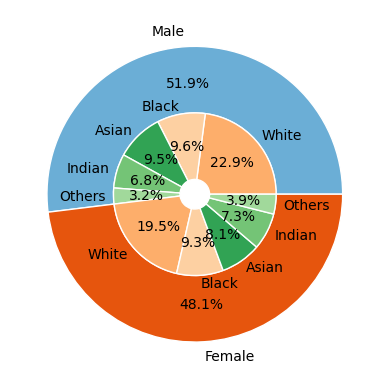

In [ ]:
# EDA: Pie chart:
fig, ax = plt.subplots()
cmap = plt.colormaps["tab20c"]
outer_colors = cmap([1,4])
inner_colors = cmap([6,7,8,9,10, 6,7,8,9,10])
size = 0.45
pctdist = 0.75

# Counts all the people travelling in the spaceship
DF_tot = DFrame['Gender'].value_counts()

# Outer pie chart (to show distribution of age variable)
ax.pie(
    np.array(DF_tot),
    autopct='%1.1f%%',
    pctdistance = pctdist,
    radius=1.0,
    colors=outer_colors,
    wedgeprops=dict(width=size, edgecolor='w'),
    labels=['Male', 'Female']    #[0, 1]
     #[df_tot.index[0],df_tot.index[1]]  #[True, False]
);

# Counts of races in females
DF_F = DFrame.Race[DFrame['Gender']=='Female'].value_counts()

# Counts of races in males
DF_M = DFrame.Race[DFrame['Gender']=='Male'].value_counts()

# Concatenate arrays, for use in inner pie chart
concat_arrays= np.concatenate((np.array(DF_M), np.array(DF_F)))  #T, F

# Inner pie chart (to show sub-distribution of "race")
ax.pie(
    concat_arrays,
    autopct='%1.1f%%',
    radius=1.0-size,
    colors=inner_colors,
    wedgeprops=dict(width=size, edgecolor='w'),
    #labels=['0','4','0']
    labels=['White','Black','Asian','Indian', 'Others',
            'White','Black','Asian','Indian', 'Others',]   #White, Black, Asian, Indian, and Others
);

## Viewing images of age-groups across races

In [ ]:
# Sample one entry from each age group in male images

sampled_white = DFrame[DFrame['Race'] == 'White'].groupby('AgeGroup_2', observed=True).apply(lambda x: x.sample(n=1, random_state=2)).reset_index(drop=True)
sampled_black = DFrame[DFrame['Race']=='Black'].groupby('AgeGroup_2', observed=True).apply(lambda x: x.sample(n=1, random_state=2)).reset_index(drop=True)
sampled_asian = DFrame[DFrame['Race']=='Asian'].groupby('AgeGroup_2', observed=True).apply(lambda x: x.sample(n=1, random_state=2)).reset_index(drop=True)
sampled_indian = DFrame[DFrame['Race']=='Indian'].groupby('AgeGroup_2', observed=True).apply(lambda x: x.sample(n=1, random_state=2)).reset_index(drop=True)
sampled_others = DFrame[DFrame['Race']=='Others'].groupby('AgeGroup_2',observed=True).apply(lambda x: x.sample(n=1, random_state=2)).reset_index(drop=True)

df = pd.concat([sampled_white, sampled_black, sampled_asian, sampled_indian, sampled_others])
df.reset_index(inplace=True)
df

<ipython-input-114-c3966b9b2f23>:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_white = DFrame[DFrame['Race'] == 'White'].groupby('AgeGroup_2', observed=True).apply(lambda x: x.sample(n=1, random_state=2)).reset_index(drop=True)
<ipython-input-114-c3966b9b2f23>:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_black = DFrame[DFrame['Race']=='Black'].groupby('AgeGroup_2', observed=True).appl

,index,Age,Gender,Race,Path,AgeGroup,AgeGroup_2
0,0,1,Male,White,/content/drive/My Drive/UTKFace_retina_cropped...,0-10,Infants
1,1,3,Male,White,/content/drive/My Drive/UTKFace_retina_cropped...,0-10,Young Children
2,2,10,Male,White,/content/drive/My Drive/UTKFace_retina_cropped...,10-20,Pre-Teens
3,3,22,Male,White,/content/drive/My Drive/UTKFace_retina_cropped...,20-30,Adolescents
4,4,28,Male,White,/content/drive/My Drive/UTKFace_retina_cropped...,20-30,Adults
5,5,38,Female,White,/content/drive/My Drive/UTKFace_retina_cropped...,30-40,Mature Adults
6,6,52,Male,White,/content/drive/My Drive/UTKFace_retina_cropped...,50-60,Mid-Aged Adults
7,7,55,Male,White,/content/drive/My Drive/UTKFace_retina_cropped...,50-60,Late Middle Age
8,8,65,Male,White,/content/drive/My Drive/UTKFace_retina_cropped...,60-70,Seniors
9,9,85,Male,White,/content/drive/My Drive/UTKFace_retina_cropped...,80-90,Elderly


In [ ]:
def plotting_images2(dframe):
  # labels for each row
  labels = ["Infants", "Young Children", "Pre-Teens", "Adolescents",
            "Adults", "Mature Adults", "Mid-Aged Adults", "Late Middle Age",
            "Seniors", "Elderly"]
  age_range = ["0-2 years", "3-9 years", "10-14 years", "15-24 years",
              "25-34 years", "35-44 years", "45-54 years", "55-64 years",
              "65-79 years", "80+ years"
              ]
  race_labels = ["White", "Black", "Asian", "Indian", "Others"]

  # Set up the plot
  fig, ax = plt.subplots(11, 6, figsize=(10, 20))  # Adjusted figsize for small images

  # Loop to display the 50 images + 10 labels (1st column) + 5 labels (1st row)
  image_index = 0
  for col in range(6):
    for row in range(11):
      # Add age group for each row only in the first column. Ignore first plot.
      if (row==0) and (col==0):
        ax[row, col].axis('off')
      elif (col == 0) :         # (0,1), (0,2), (0,3), ...,(0,9), (0,10)

        ax[row, col].text(0.5, 0.55, labels[row-1], color="white", fontsize=12,    #labels[row-1]  now row=1,2,...,10 --> need--> 0,1,...,9
           ha='center', va='center', transform=ax[row, col].transAxes,
           bbox=dict(facecolor="black", alpha=0.7, boxstyle="round,pad=0.5"))

        ax[row, col].text(0.5, 0.35, age_range[row-1], color="white", fontsize=12,
          ha='center', va='center',transform=ax[row, col].transAxes,
          bbox=dict(facecolor="black", alpha=0.7, boxstyle="round,pad=0.5"))

        ax[row, col].axis('off')

      elif (row==0):
        ax[row, col].text(0.5, 0.10, race_labels[col-1], color="white", fontsize=12,  #race_labels[col-1]  now col=1,2,..,5 --> need--> 0,1,...,4
          ha='center', va='center',transform=ax[row, col].transAxes,
          bbox=dict(facecolor="black", alpha=0.7, boxstyle="round,pad=0.5"))
        ax[row, col].axis('off')

      else:
        # Load the image from the path
        image_path = dframe['Path'].iloc[image_index]
        img = cv2.imread(image_path, cv2.IMREAD_COLOR)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Display the image
        ax[row, col].imshow(img)
        ax[row, col].axis('off')
        image_index = image_index + 1

  # Adjust layout to fit all elements
  plt.tight_layout()
  plt.show()

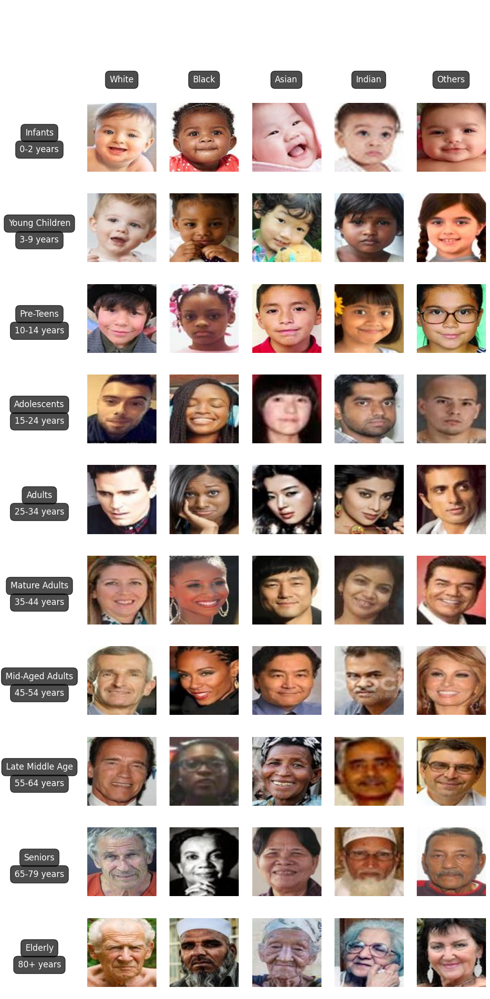

In [ ]:
plotting_images2(df)

### Viewing male images of age-groups across races

<ipython-input-117-4247e69952cb>:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_white = DFrame[(DFrame['Race'] == 'White') & ((DFrame['Gender'] == 'Male'))].groupby('AgeGroup_2', observed=True).apply(lambda x: x.sample(n=1, random_state=2)).reset_index(drop=True)
<ipython-input-117-4247e69952cb>:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_black = DFrame[(DFrame['Race'] == 'Black') & (

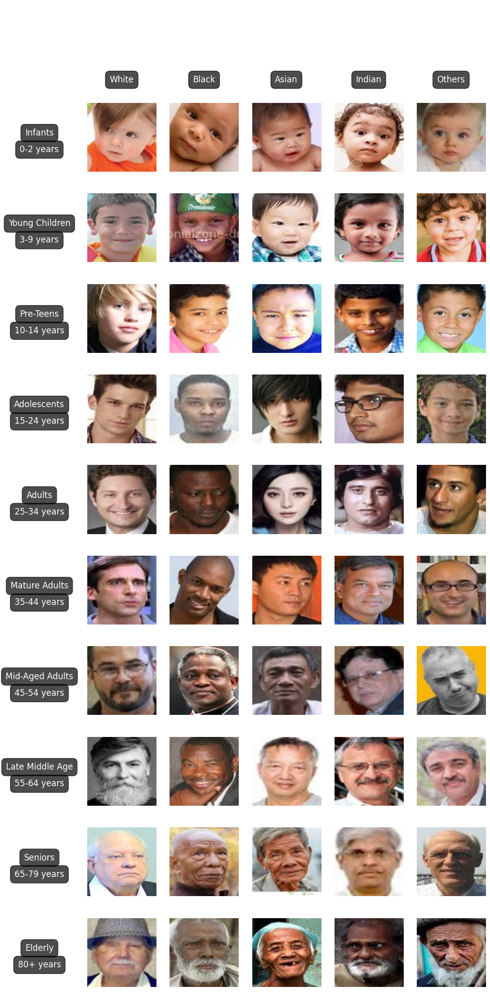

In [ ]:
# Sample one entry from each age group in male images
sampled_white = DFrame[(DFrame['Race'] == 'White') & ((DFrame['Gender'] == 'Male'))].groupby('AgeGroup_2', observed=True).apply(lambda x: x.sample(n=1, random_state=2)).reset_index(drop=True)
sampled_black = DFrame[(DFrame['Race'] == 'Black') & ((DFrame['Gender'] == 'Male'))].groupby('AgeGroup_2', observed=True).apply(lambda x: x.sample(n=1, random_state=2)).reset_index(drop=True)
sampled_asian = DFrame[(DFrame['Race'] == 'Asian') & ((DFrame['Gender'] == 'Male'))].groupby('AgeGroup_2', observed=True).apply(lambda x: x.sample(n=1, random_state=2)).reset_index(drop=True)
sampled_indian = DFrame[(DFrame['Race'] == 'Indian') & ((DFrame['Gender'] == 'Male'))].groupby('AgeGroup_2', observed=True).apply(lambda x: x.sample(n=1, random_state=2)).reset_index(drop=True)
sampled_others = DFrame[(DFrame['Race'] == 'Others') & ((DFrame['Gender'] == 'Male'))].groupby('AgeGroup_2',observed=True).apply(lambda x: x.sample(n=1, random_state=1)).reset_index(drop=True)

df = pd.concat([sampled_white, sampled_black, sampled_asian, sampled_indian, sampled_others])
df.reset_index(inplace=True)
plotting_images2(df)

### Viewing female images of age-groups across races

<ipython-input-118-5afc21aa0024>:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_white = DFrame[(DFrame['Race'] == 'White') & ((DFrame['Gender'] == 'Female'))].groupby('AgeGroup_2', observed=True).apply(lambda x: x.sample(n=1, random_state=2)).reset_index(drop=True)
<ipython-input-118-5afc21aa0024>:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sampled_black = DFrame[(DFrame['Race'] == 'Black') &

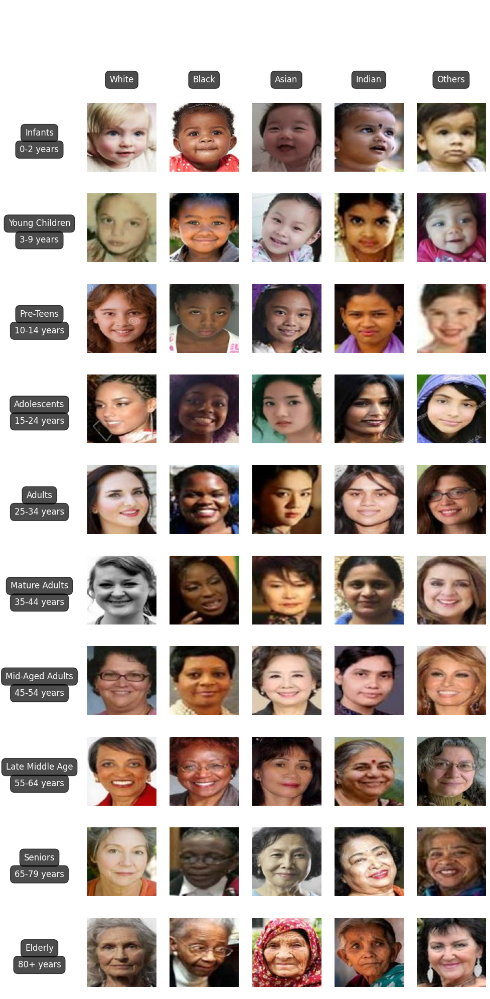

In [ ]:
# Sample one entry from each age group in female images
sampled_white = DFrame[(DFrame['Race'] == 'White') & ((DFrame['Gender'] == 'Female'))].groupby('AgeGroup_2', observed=True).apply(lambda x: x.sample(n=1, random_state=2)).reset_index(drop=True)
sampled_black = DFrame[(DFrame['Race'] == 'Black') & ((DFrame['Gender'] == 'Female'))].groupby('AgeGroup_2', observed=True).apply(lambda x: x.sample(n=1, random_state=2)).reset_index(drop=True)
sampled_asian = DFrame[(DFrame['Race'] == 'Asian') & ((DFrame['Gender'] == 'Female'))].groupby('AgeGroup_2', observed=True).apply(lambda x: x.sample(n=1, random_state=2)).reset_index(drop=True)
sampled_indian = DFrame[(DFrame['Race'] == 'Indian') & ((DFrame['Gender'] == 'Female'))].groupby('AgeGroup_2', observed=True).apply(lambda x: x.sample(n=1, random_state=2)).reset_index(drop=True)
sampled_others = DFrame[(DFrame['Race'] == 'Others') & ((DFrame['Gender'] == 'Female'))].groupby('AgeGroup_2',observed=True).apply(lambda x: x.sample(n=1, random_state=2)).reset_index(drop=True)

df = pd.concat([sampled_white, sampled_black, sampled_asian, sampled_indian, sampled_others])
df.reset_index(inplace=True)
plotting_images2(df)